In [ ]:
cd ..

In [78]:
__requires__= 'numpy>=1.16.5'
import pkg_resources
pkg_resources.require('numpy>=1.16.5')
import numpy as np

In [79]:
import pickle
# import numpy as np
import matplotlib.pyplot as plt
from src.visualisation import compare
import pandas as pd
import seaborn as sns
import tqdm

In [16]:
from skimage.metrics import structural_similarity, peak_signal_noise_ratio, mean_squared_error

In [5]:
import warnings
warnings.filterwarnings('ignore')

In [72]:
def show_loss(history, savefile):
    plt.plot(history["loss"], label='loss')
    plt.plot(history["val_loss"], label='val_los')
    plt.yscale('log')
    plt.legend()
#     plt.savefig(savefile)
    plt.show()
    

In [73]:
def freq_compare(x,y):
    return np.abs( np.fft.fftshift(np.fft.fft2(np.fft.fftshift(x), norm='ortho')) - np.fft.fftshift(np.fft.fft2(np.fft.fftshift(y), norm='ortho')))

In [74]:
def compute_statistics(results, metrics):
    statistics = pd.DataFrame(columns=["PSNR", "SSIM", "MSE", "method", "set"])#{}
    statistics["PSNR"] = 0
        # statistics[metric] = pd.DataFrame()
    for name, sets, x, y in tqdm.tqdm(results):
        df = pd.DataFrame()
        for metric, f in metrics:
            df[metric] = [f(x[i,:,:,0],y[i,:,:,0]) for i in range(len(x))]
        df['Method'] = name
        df['Set'] = sets
        if statistics.empty:
            statistics = df
        else:
            statistics = statistics.append(df, ignore_index=False)
            
    with pd.option_context('mode.use_inf_as_na', True):
        statistics.dropna(inplace=True)
    return statistics

In [75]:
def print_statistics(statistics, results, metrics):
    print(f"|{'Name':20}|", end="")
    for metric, f in metrics:
        print(f"{metric:20}|", end="")
    print()
    for name, set, x, y in results:
        print(f"|{name+'_'+set:20}|", end="")
        for metric, f in metrics:
            print(f"{np.mean(statistics[metric][(statistics.Method == name) * (statistics.Set == set)]):8.3f} \pm {np.std(statistics[metric][(statistics.Method == name) * (statistics.Set == set)]):7.3f}|", end="")
        print()

In [76]:
def plot_statistics(statistics, metrics):
    fig, ax = plt.subplots(ncols=len(metrics), figsize=(len(metrics)*8, 6))
    for idx, (metric, _) in enumerate(metrics):
        plt.sca(ax[idx])
        sns.set_style('whitegrid')
        sns.violinplot(data=statistics, x='Method', y=metric, split=True, hue='Set', palette="Set3", bw=.2, cut=1, linewidth=1, inner='quart', order=["Dirty", "U-net", "Primal Dual"])
        plt.ylabel(metric, fontsize='x-large')
        plt.xlabel("")
        ax[idx].tick_params(labelsize='x-large')
        # ax[idx].xaxis.label.set_size('x-large')
        sns.despine(left=True, bottom=True)
        plt.legend(loc="upper left", fontsize='large')
    ax[2].set_ylim([-0.005,0.04])
    plt.show()

In [77]:
def result(
    ISNR = 30,
    data="COCO",
    network="medium",
    activation="sigmoid_2",
):


    x_true = np.load(f"./data/intermediate/{data}/x_true_train_{ISNR}dB.npy")
    x_dirty = np.load(f"./data/intermediate/{data}/x_dirty_train_{ISNR}dB.npy")

    x_true_test = np.load(f"./data/intermediate/{data}/x_true_test_{ISNR}dB.npy")
    x_dirty_test = np.load(f"./data/intermediate/{data}/x_dirty_test_{ISNR}dB.npy")

    PD_train_predict = np.load(f"./data/processed/{data}/PD_train_predict_{ISNR}dB.npy")
    PD_test_predict = np.load(f"./data/processed/{data}/PD_test_predict_{ISNR}dB.npy")

    NN_train_predict = np.load(f"./data/processed/{data}/train_predict_{network}_{ISNR}dB_{activation}.npy")
    NN_test_predict = np.load(f"./data/processed/{data}/test_predict_{network}_{ISNR}dB_{activation}.npy")


    sns.set_style("white")
    history = pd.read_csv(f"./logs/{data}/log_{network}_{ISNR}dB_{activation}")

#     show_loss(history, savefile=f'./results/{data}/loss_{network}_{ISNR}dB_{activation}.png')

    results = [
        ("Dirty", "Train", x_true, x_dirty),
        ("Primal Dual", "Train", x_true, PD_train_predict),
        ("U-net", "Train", x_true, NN_train_predict),

        ("Dirty", "Test", x_true_test, x_dirty_test),
        ("Primal Dual", "Test", x_true_test, PD_test_predict),
        ("U-net", "Test", x_true_test, NN_test_predict),
    ]

    metrics = [
        ("PSNR", peak_signal_noise_ratio),
        ("SSIM", structural_similarity),
        ("MSE", mean_squared_error)
    ]

    i=0

    for j in range(len(results)):
        name, dset, true, pred = results[j]

        compare([true[i,:,:,0], pred[i,:,:,0], true[i,:,:,0]-pred[i,:,:,0], np.log(freq_compare(true[i,:,:,0], pred[i,:,:,0]))], 
                titles=["Ground Truth", name + " " + dset, f"image error (MSE: {mean_squared_error(true[i,:,:,0], pred[i,:,:,0]):.3f})", "frequency error"], colorbar=True)


    statistics = compute_statistics(results, metrics)
    print_statistics(statistics, results, metrics)
    plot_statistics(statistics, metrics)
    
    sns.set_style("white")
    titles = []
    freq_analysis = []
    for j in range(len(results)):
        name, dset, true, pred = results[j]
        freq_residuals = [freq_compare(true[i,:,:,0], pred[i,:,:,0]) for i in range(len(true))]

        titles.append(name + " " + dset)
        freq_analysis.append( np.mean(freq_residuals, axis=0))

    compare([np.log(i) for i in freq_analysis], ncols=len(results)//2, nrows=2, titles=titles, colorbar=True)
    

## COCO dataset no noise

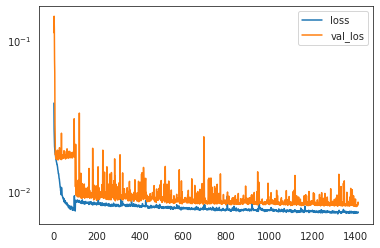

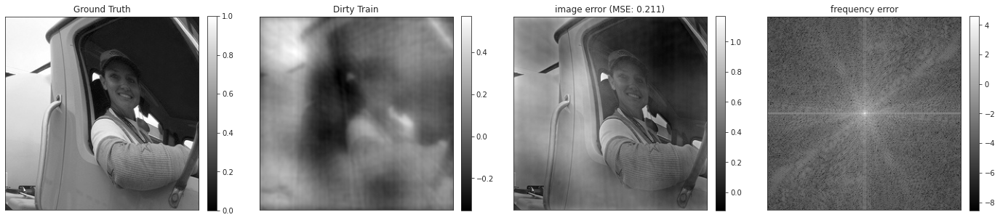

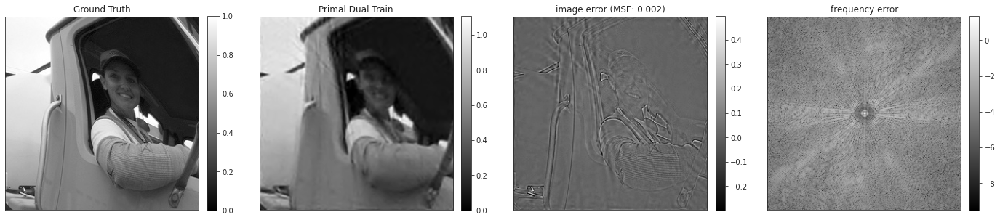

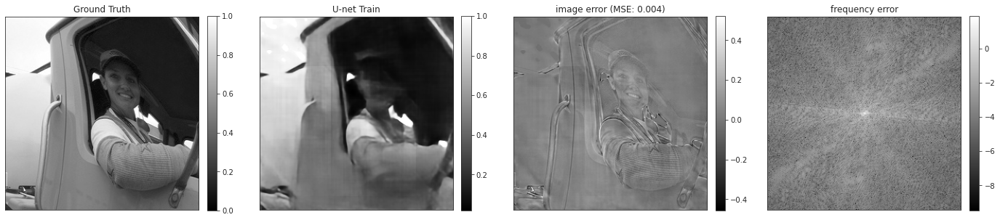

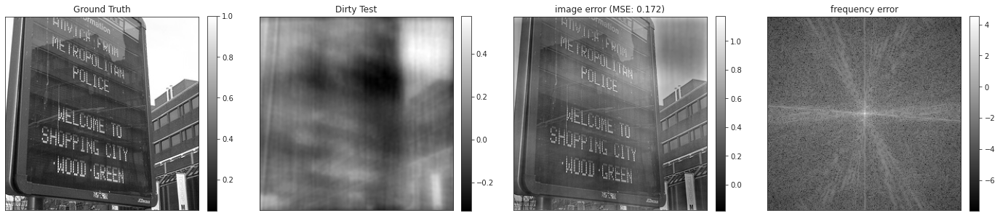

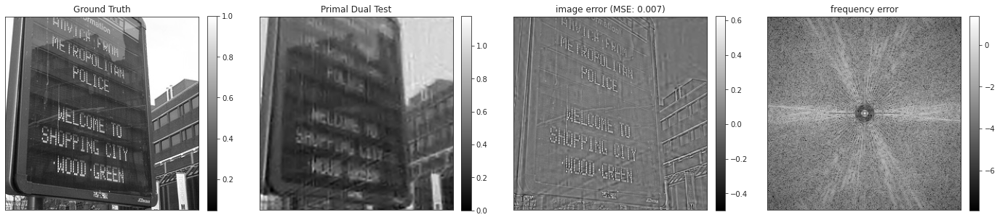

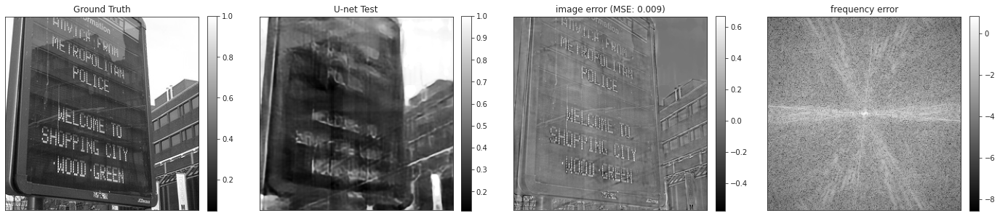

100%|██████████| 6/6 [01:15<00:00, 12.51s/it]


|Name                |PSNR                |SSIM                |MSE                 |
|Dirty_Train         |   7.465 \pm   2.330|   0.099 \pm   0.054|   0.203 \pm   0.096|
|Primal Dual_Train   |  23.951 \pm   3.783|   0.764 \pm   0.119|   0.006 \pm   0.005|
|U-net_Train         |  21.791 \pm   3.346|   0.725 \pm   0.120|   0.008 \pm   0.006|
|Dirty_Test          |   7.612 \pm   2.482|   0.094 \pm   0.054|   0.199 \pm   0.100|
|Primal Dual_Test    |  23.816 \pm   3.748|   0.760 \pm   0.119|   0.006 \pm   0.005|
|U-net_Test          |  21.695 \pm   3.182|   0.720 \pm   0.120|   0.009 \pm   0.006|


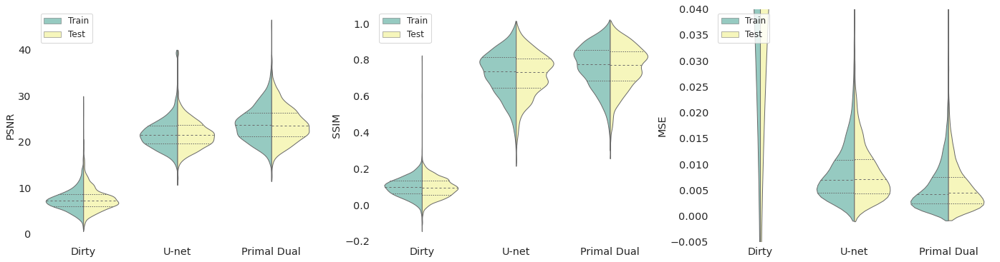

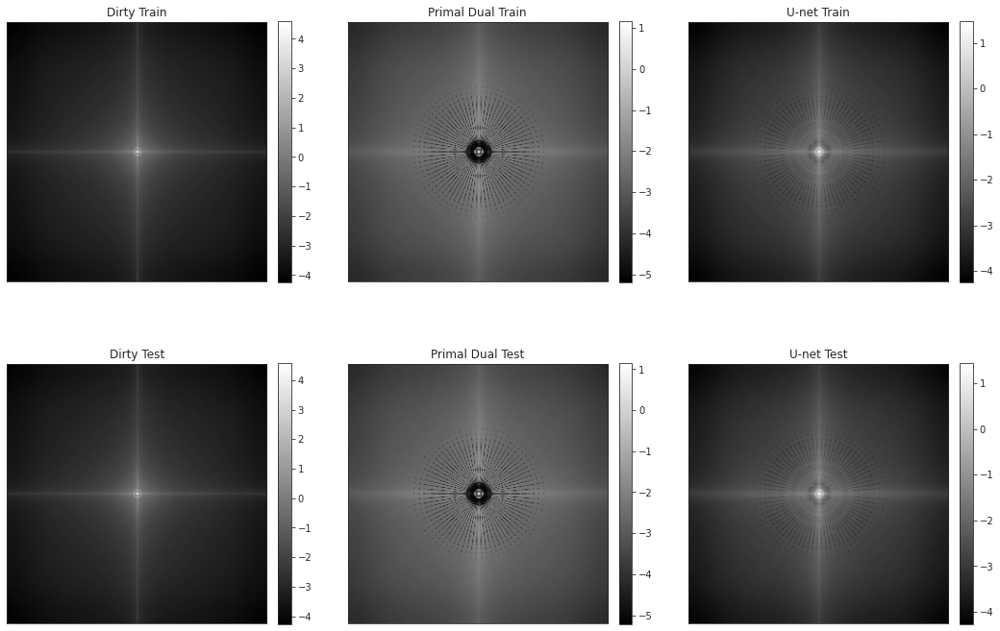

In [12]:
result( ISNR = 50,
    data="COCO",
    network="medium",
    activation="sigmoid_2")

## COCO dataset with noise

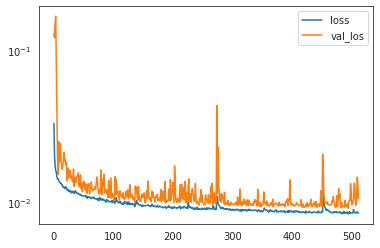

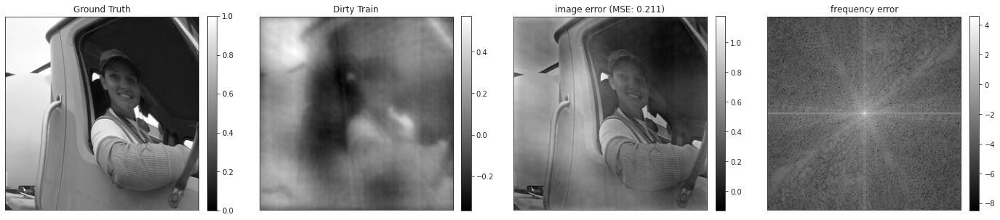

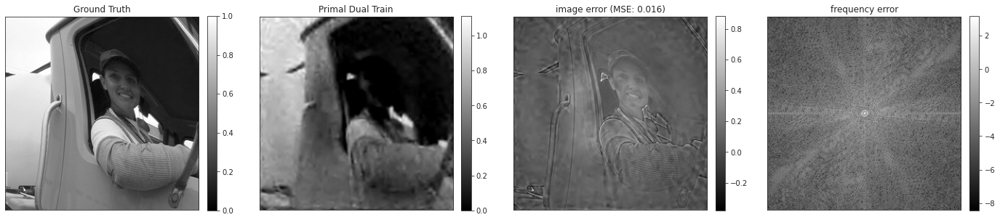

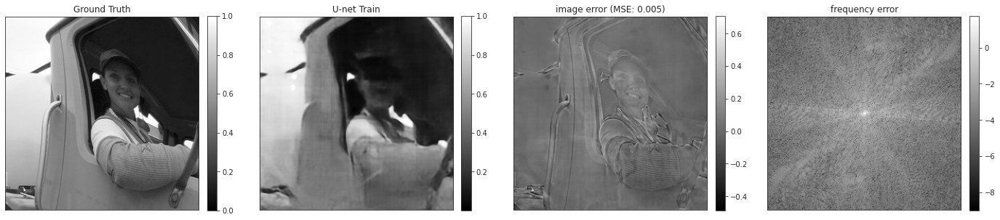

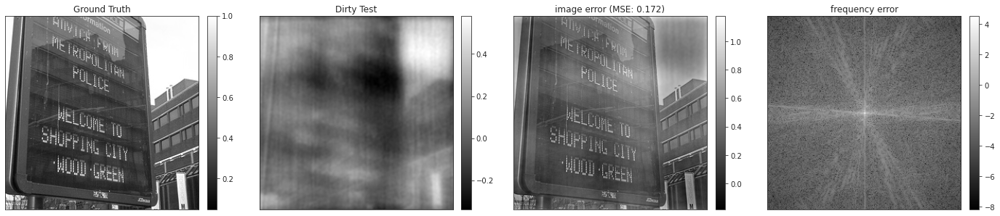

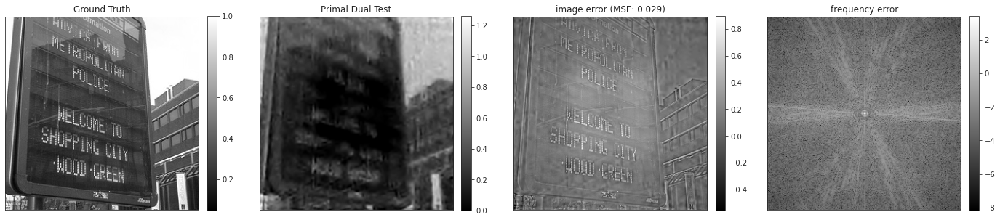

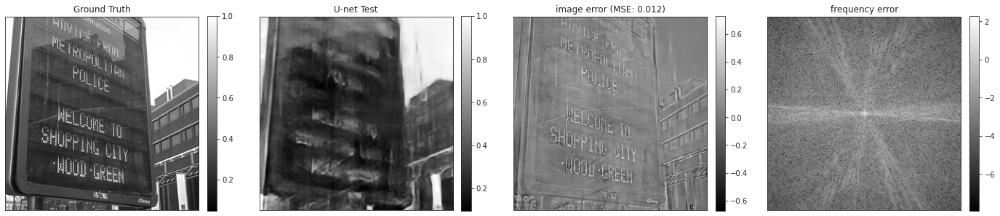

100%|██████████| 6/6 [01:17<00:00, 12.93s/it]


|Name                |PSNR                |SSIM                |MSE                 |
|Dirty_Train         |   7.464 \pm   2.330|   0.099 \pm   0.054|   0.203 \pm   0.096|
|Primal Dual_Train   |  17.635 \pm   2.617|   0.628 \pm   0.104|   0.020 \pm   0.010|
|U-net_Train         |  21.021 \pm   3.354|   0.698 \pm   0.137|   0.014 \pm   0.052|
|Dirty_Test          |   7.611 \pm   2.481|   0.094 \pm   0.053|   0.199 \pm   0.100|
|Primal Dual_Test    |  17.677 \pm   2.721|   0.624 \pm   0.103|   0.020 \pm   0.010|
|U-net_Test          |  21.037 \pm   3.198|   0.696 \pm   0.129|   0.012 \pm   0.040|


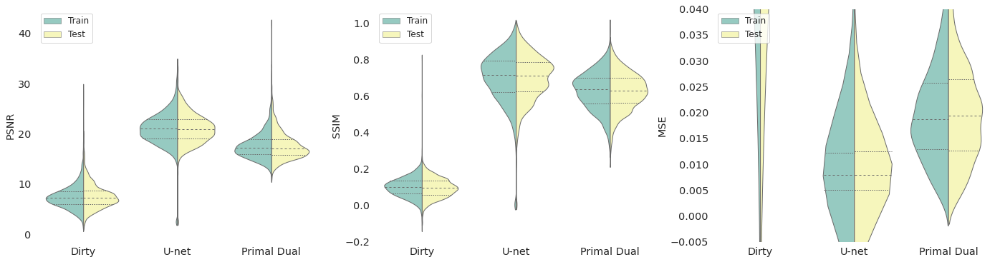

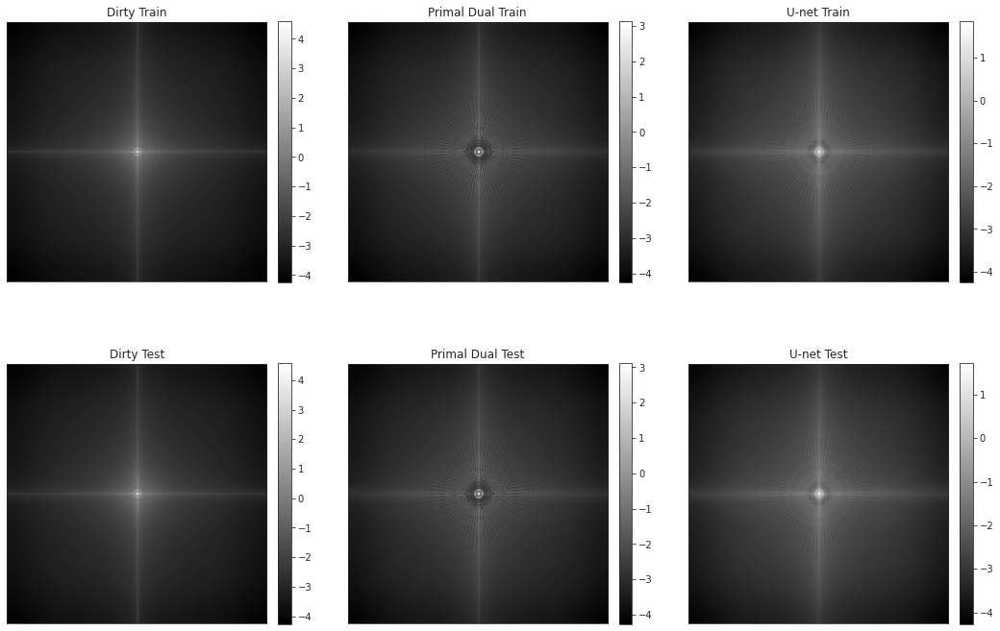

In [13]:
result( ISNR = 30,
    data="COCO",
    network="medium",
    activation="sigmoid_2")

## With Grad

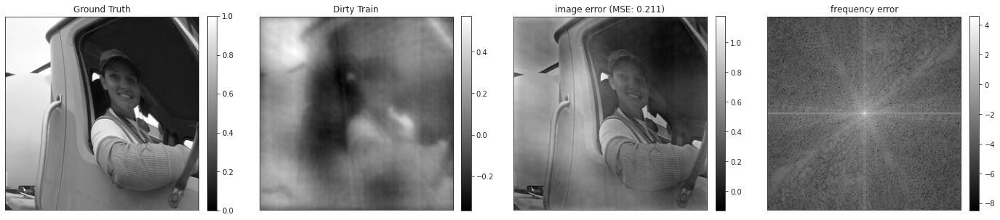

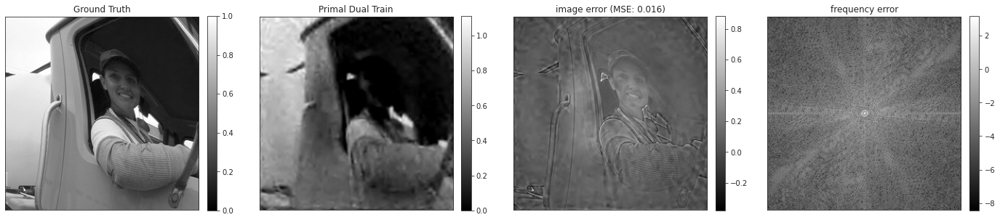

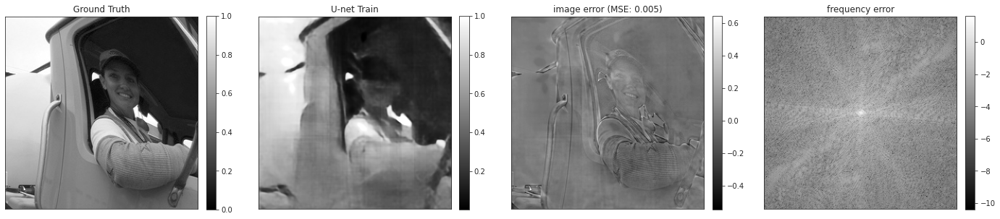

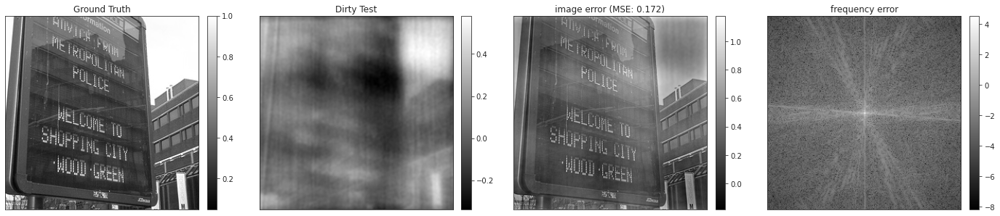

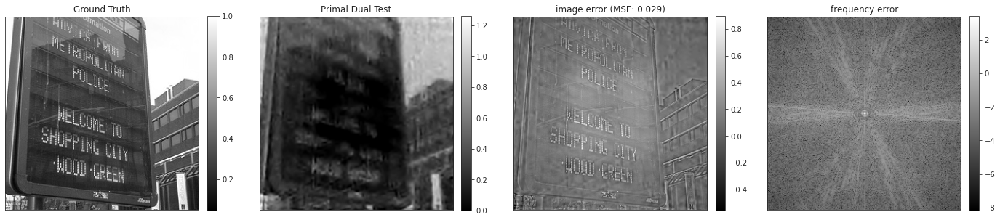

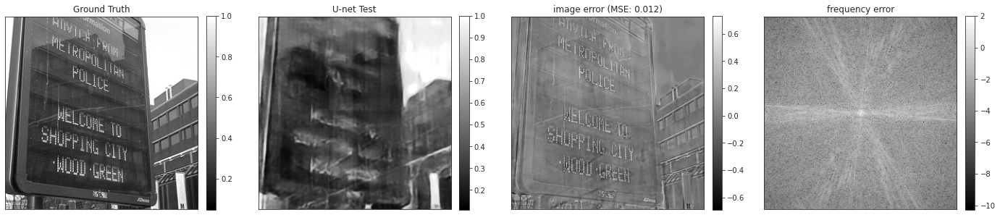

  0%|          | 0/6 [00:00<?, ?it/s]/lustre/home/ucapmm6/src_aiai/env/lib/python3.7/site-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)
 33%|███▎      | 2/6 [00:38<01:18, 19.56s/it]/lustre/home/ucapmm6/src_aiai/env/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im_true.
  
/lustre/home/ucapmm6/src_aiai/env/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  
100%|██████████| 6/6 [01:19<00:00, 13.28s/it]
/lustre/home/ucapmm6/src_aiai/env/lib/python3.7/site-packages/pandas/core/computation/expressions.py:178: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  f"evaluating in Python space because the {repr(op_str)} "


|Name                |PSNR                |SSIM                |MSE                 |
|Dirty_Train         |   7.464 \pm   2.330|   0.099 \pm   0.054|   0.203 \pm   0.096|
|Primal Dual_Train   |  17.635 \pm   2.617|   0.628 \pm   0.104|   0.020 \pm   0.010|
|U-net_Train         |  21.053 \pm   3.780|   0.696 \pm   0.124|   0.010 \pm   0.006|
|Dirty_Test          |   7.611 \pm   2.481|   0.094 \pm   0.053|   0.199 \pm   0.100|
|Primal Dual_Test    |  17.677 \pm   2.721|   0.624 \pm   0.103|   0.020 \pm   0.010|
|U-net_Test          |  20.900 \pm   3.443|   0.690 \pm   0.122|   0.010 \pm   0.007|


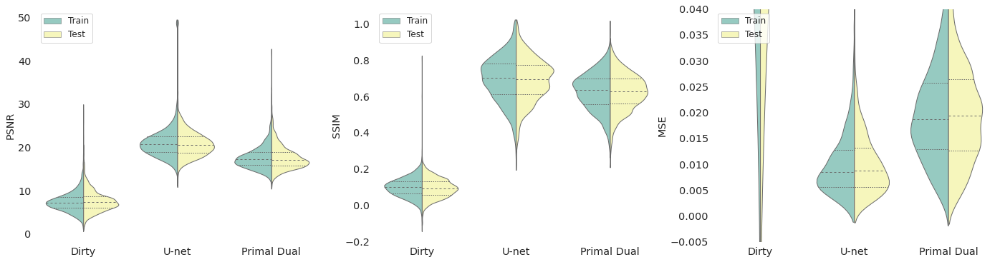

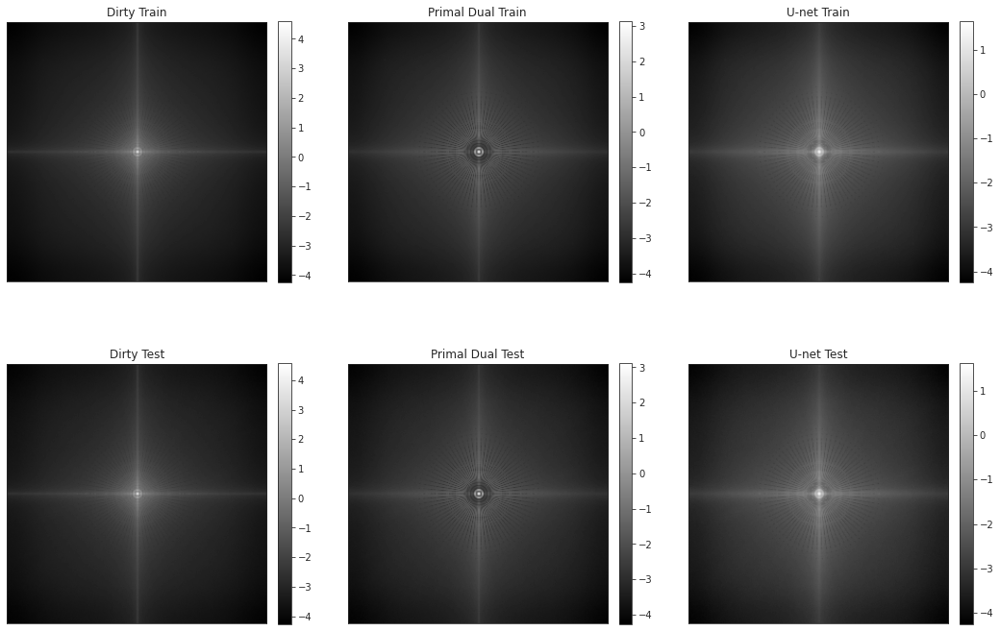

In [85]:
result( ISNR = 30,
    data="COCO",
    network="medium",
    activation="sigmoid_grad")

In [87]:
ISNR = 30
data="COCO"
network="medium"
activation="_sigmoid_grad"

x_true = np.load( f"./data/intermediate/{data}/x_true_train_{ISNR}dB.npy")

x_dirty = np.load( f"./data/intermediate/{data}/x_dirty_train_{ISNR}dB.npy")
a = np.load(f"./data/processed/{data}/train_predict_{network}_{ISNR}dB" + activation + ".npy")

In [74]:
fft_1 = lambda x: np.fft.fftshift(np.fft.fft2(np.fft.fftshift(x, axes=(-3,-2)), axes=(-3,-2), norm='ortho'), axes=(-3,-2))
fft_2 = lambda x: np.fft.fftshift(np.fft.fft2(np.fft.fftshift(x), norm='ortho'))


In [80]:
a1 = fft_1(x_dirty[:,:,:,:])

In [ ]:
a2 = fft_2(x_dirty[0,:,:,0] +0j)

In [81]:
np.allclose(a1[0,:,:,0], a2)

True

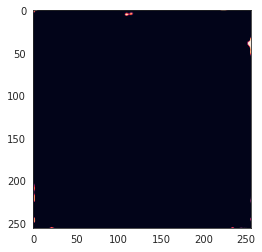

In [88]:
plt.imshow((a[0,:,:,0])) 

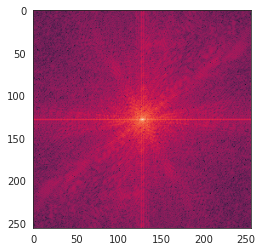

In [70]:
plt.imshow(np.log(np.abs(c[0,:,:,0])))

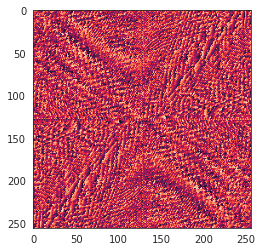

In [71]:
plt.imshow((np.angle(c[0,:,:,0])))

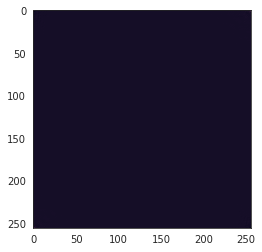

In [58]:
plt.imshow(( np.fft.fft2(x_true[0,:,:,0]).real) )

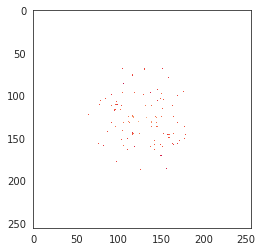

In [50]:
plt.imshow(np.log(c[0].real))

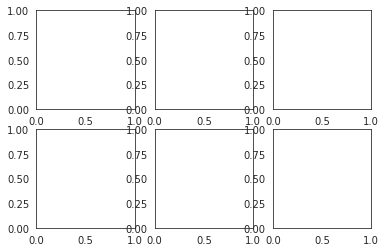

In [16]:
fig, ax = plt.subplots(ncols=3, nrows=2)

In [18]:
ax.shape

(2, 3)

In [192]:
ISNR = 30
data="COCO"
network="medium"
activation="sigmoid_2"

In [191]:
x_true = np.load(f"./data/intermediate/{data}/x_true_train_{ISNR}dB.npy")
x_dirty = np.load(f"./data/intermediate/{data}/x_dirty_train_{ISNR}dB.npy")

x_true_test = np.load(f"./data/intermediate/{data}/x_true_test_{ISNR}dB.npy")
x_dirty_test = np.load(f"./data/intermediate/{data}/x_dirty_test_{ISNR}dB.npy")

PD_train_predict = np.load(f"./data/processed/{data}/PD_train_predict_{ISNR}dB.npy")
PD_test_predict = np.load(f"./data/processed/{data}/PD_test_predict_{ISNR}dB.npy")


In [193]:
NN_train_predict = np.load(f"./data/processed/{data}/train_predict_{network}_{ISNR}dB_{activation}.npy")
NN_test_predict = np.load(f"./data/processed/{data}/test_predict_{network}_{ISNR}dB_{activation}.npy")

In [194]:
sns.set_style("white")
history = pd.read_csv(f"./logs/{data}/log_{network}_{ISNR}dB_{activation}")

No handles with labels found to put in legend.


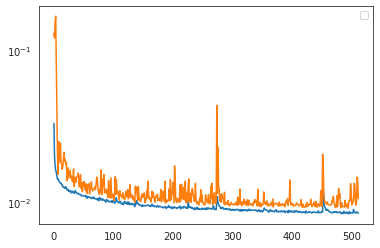

In [195]:
plt.plot(history["loss"])
plt.plot(history["val_loss"])
plt.yscale('log')
plt.legend()

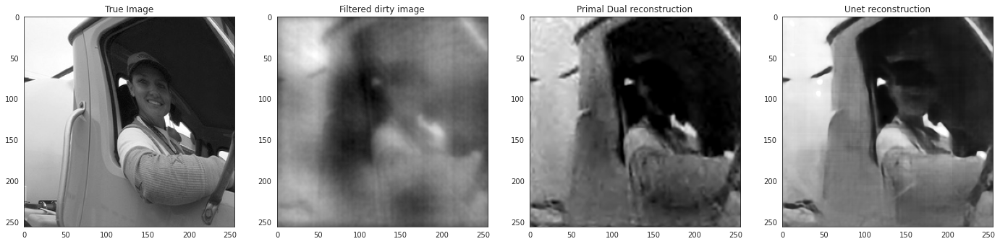

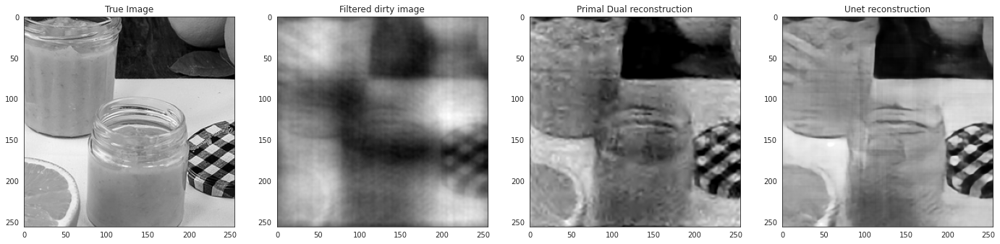

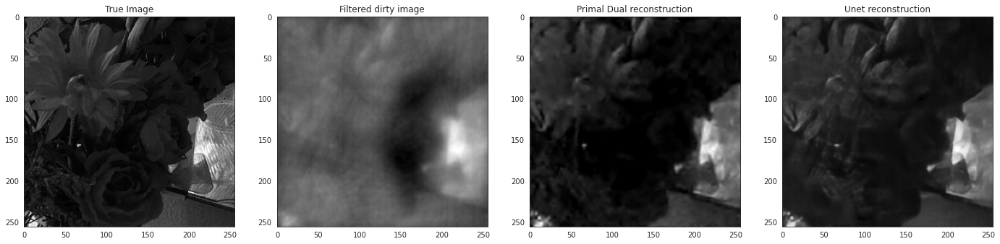

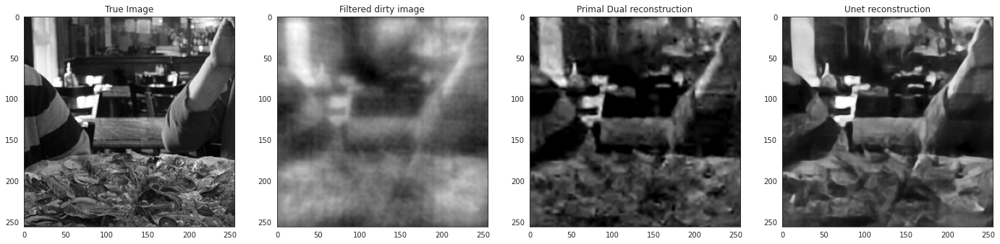

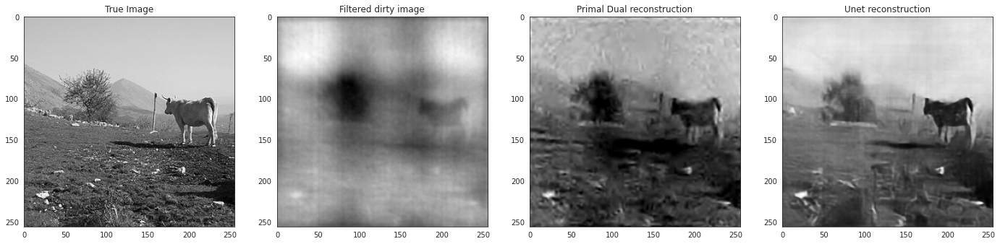

In [196]:
for i in range(5):
    compare([x_true[i,:,:,0], x_dirty[i,:,:,0], PD_train_predict[i,:,:,0], NN_train_predict[i,:,:,0]], titles=["True Image", "Filtered dirty image", "Primal Dual reconstruction", "Unet reconstruction"])

## test set

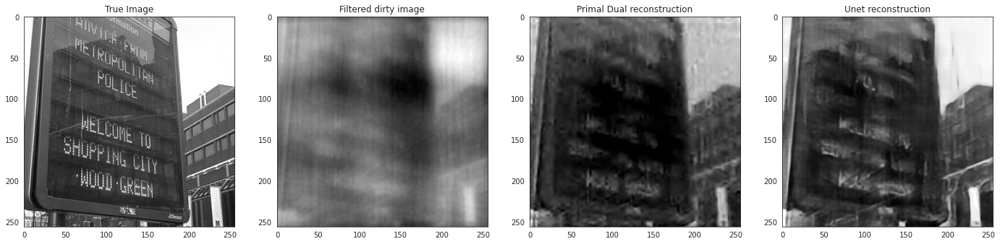

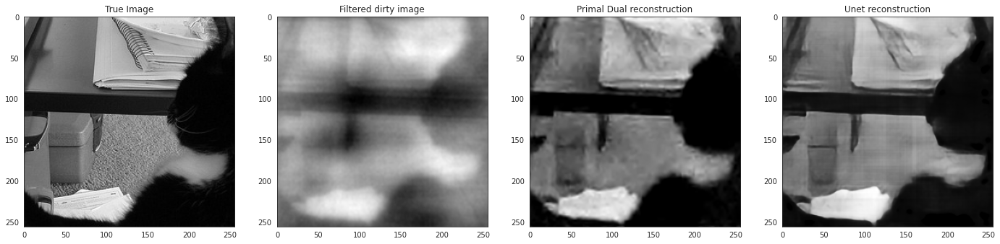

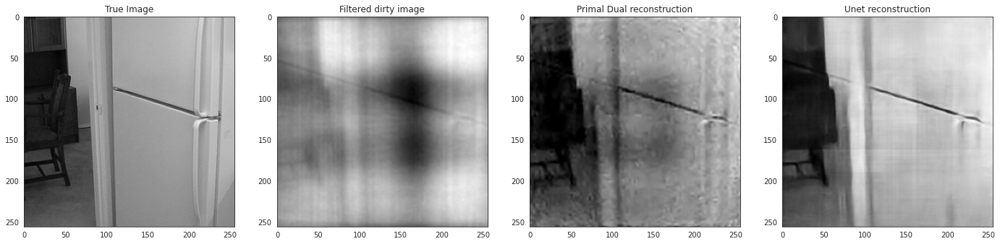

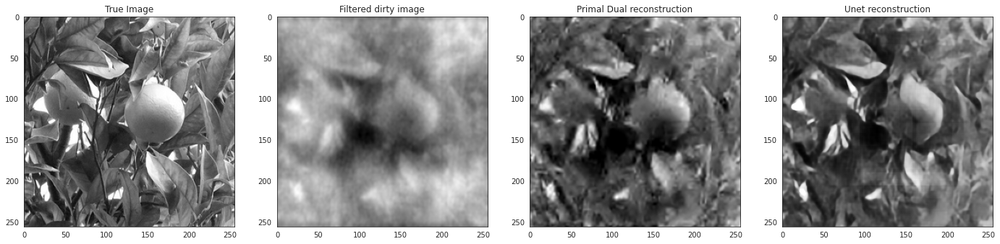

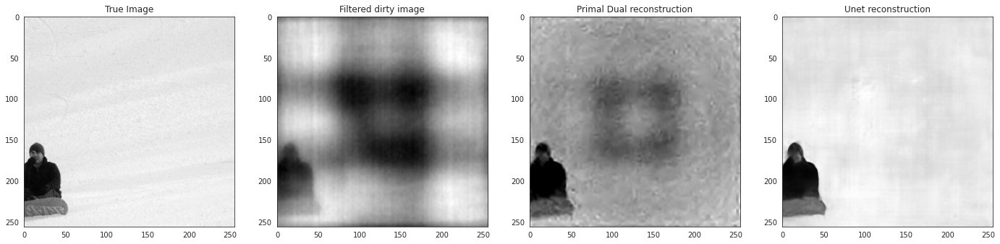

In [197]:
for i in range(5):
    compare([x_true_test[i,:,:,0], x_dirty_test[i,:,:,0], PD_test_predict[i,:,:,0], NN_test_predict[i,:,:,0]], titles=["True Image", "Filtered dirty image", "Primal Dual reconstruction", "Unet reconstruction"])

In [198]:
results = [
    ("Dirty", "Train", x_true, x_dirty),
    ("Dirty", "Test", x_true_test, x_dirty_test),

    ("Primal Dual", "Train", x_true, PD_train_predict),
    ("Primal Dual", "Test", x_true_test, PD_test_predict),
    ("U-net", "Train", x_true, NN_train_predict),
    ("U-net", "Test", x_true_test, NN_test_predict),
]

metrics = [
    ("PSNR", peak_signal_noise_ratio),
    ("SSIM", structural_similarity),
    ("MSE", mean_squared_error)
]

In [199]:
statistics = pd.DataFrame(columns=["PSNR", "SSIM", "MSE", "method", "set"])#{}
statistics["PSNR"] = 0
    # statistics[metric] = pd.DataFrame()
for name, sets, x, y in tqdm.tqdm(results):
    df = pd.DataFrame()
    for metric, f in metrics:
        df[metric] = [f(x[i,:,:,0],y[i,:,:,0]) for i in range(len(x))]
    df['Method'] = name
    df['Set'] = sets
    if statistics.empty:
        statistics = df
    else:
        statistics = statistics.append(df, ignore_index=False)

100%|██████████| 6/6 [01:20<00:00, 13.46s/it]


In [200]:
with pd.option_context('mode.use_inf_as_na', True):
    statistics.dropna(inplace=True)

In [201]:
width = 10
print(f"|{'Name':20}|", end="")
for metric, f in metrics:
    print(f"{metric:20}|", end="")
print()
for name, sets, x, y in results:
    print(f"|{name+'_'+set:20}|", end="")
    for metric, f in metrics:
        print(f"{np.mean(statistics[metric][(statistics.Method == name) * (statistics.Set == sets)]):20.3f}|", end="")
    print()

|Name                |PSNR                |SSIM                |MSE                 |
|Dirty_Test          |               7.464|               0.099|               0.203|
|Dirty_Test          |               7.611|               0.094|               0.199|
|Primal Dual_Test    |              17.635|               0.628|               0.020|
|Primal Dual_Test    |              17.677|               0.624|               0.020|
|U-net_Test          |              21.021|               0.698|               0.014|
|U-net_Test          |              21.037|               0.696|               0.012|


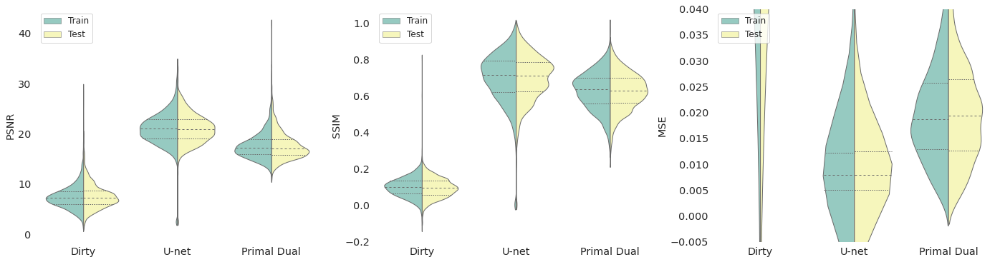

In [202]:
fig, ax = plt.subplots(ncols=len(metrics), figsize=(len(metrics)*8, 6))
for idx, (metric, _) in enumerate(metrics):
    plt.sca(ax[idx])
    sns.set_style('whitegrid')
    sns.violinplot(data=statistics, x='Method', y=metric, split=True, hue='Set', palette="Set3", bw=.2, cut=1, linewidth=1, inner='quart', order=["Dirty", "U-net", "Primal Dual"])
    plt.ylabel(metric, fontsize='x-large')
    plt.xlabel("")
    ax[idx].tick_params(labelsize='x-large')
    # ax[idx].xaxis.label.set_size('x-large')
    sns.despine(left=True, bottom=True)
    plt.legend(loc="upper left", fontsize='large')
ax[2].set_ylim([-0.005,0.04])
plt.show()

In [81]:
x_true.shape, x_true_test.shape

((3000, 256, 256, 1), (1000, 256, 256, 1))

# COCO

In [110]:
ISNR = 50
data="COCO"
network="medium"
activation="sigmoid_2"

# x_true = np.load(f"./data/intermediate/{data}/x_true_train_{ISNR}dB.npy")
# x_dirty = np.load(f"./data/intermediate/{data}/x_dirty_train_{ISNR}dB.npy")


# x_true_test= np.load(f"./data/intermediate/{data}/x_true_test_{ISNR}dB.npy")
# x_dirty_test = np.load(f"./data/intermediate/{data}/x_dirty_test_{ISNR}dB.npy")

In [54]:
# PD_train_predict = np.load(f"./data/processed/{data}/PD_train_predict_{ISNR}dB.npy")
# PD_test_predict = np.load(f"./data/processed/{data}/PD_test_predict_{ISNR}dB.npy")

In [111]:


NN_train_predict_2 = np.load(f"./data/processed/{data}/train_predict_{network}_{ISNR}dB_{activation}.npy")
NN_test_predict_2 = np.load(f"./data/processed/{data}/test_predict_{network}_{ISNR}dB_{activation}.npy")



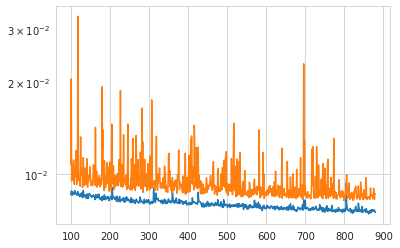

In [131]:
NN_history = pd.read_csv(f"./logs/{data}/log_{network}_{ISNR}dB_{activation}")

plt.plot(NN_history["loss"].iloc[100:])
plt.plot(NN_history["val_loss"].iloc[100:])
plt.yscale('log')

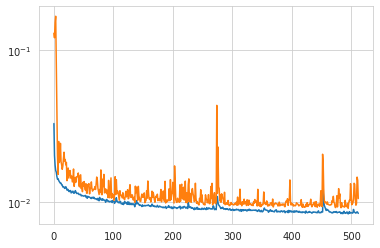

In [132]:
NN_history = pd.read_csv(f"./logs/{data}/log_{network}_30dB_{activation}")

plt.plot(NN_history["loss"])
plt.plot(NN_history["val_loss"])
plt.yscale('log')

In [181]:
b = np.load('./data/processed/COCO/PD_test_predict_30dB.npy')

In [184]:
b[0]

array([[[1.02550936],
        [1.05665088],
        [0.9769901 ],
        ...,
        [0.82756203],
        [0.79449451],
        [0.66804069]],

       [[1.07748699],
        [1.06575775],
        [0.99935538],
        ...,
        [0.91060209],
        [0.92709655],
        [0.87442541]],

       [[1.11711407],
        [1.0629636 ],
        [1.01518202],
        ...,
        [1.14205015],
        [1.15515399],
        [1.10959542]],

       ...,

       [[0.81406909],
        [1.0345614 ],
        [0.92925161],
        ...,
        [0.19018583],
        [0.17751163],
        [0.13770463]],

       [[0.8149271 ],
        [1.03457034],
        [0.92817295],
        ...,
        [0.16674106],
        [0.15828168],
        [0.13040251]],

       [[0.89488739],
        [1.11429322],
        [0.96319884],
        ...,
        [0.15051149],
        [0.17174503],
        [0.19602761]]])

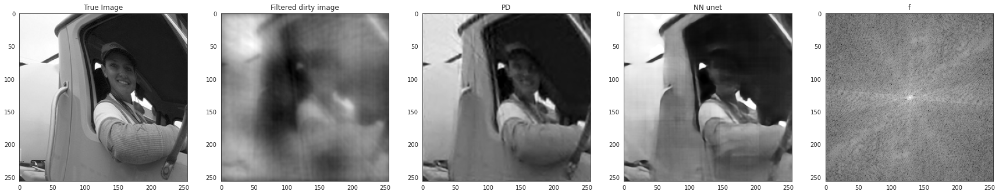

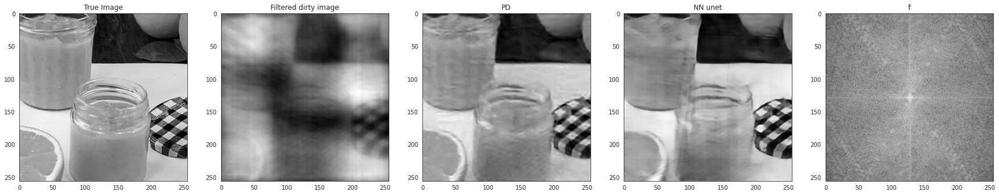

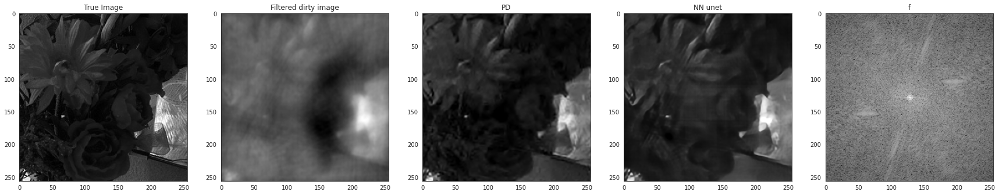

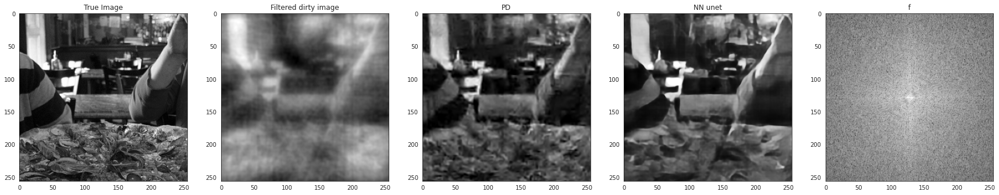

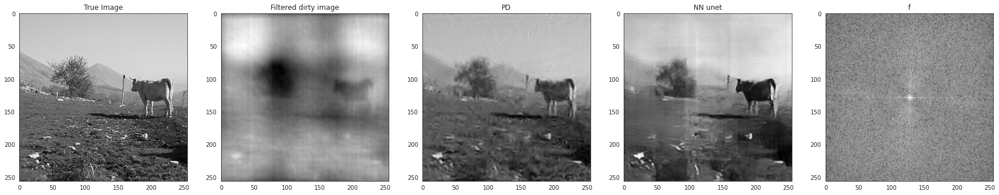

In [166]:
sns.set_style('white')
for i in range(5):
    compare([x_true[i,:,:,0], x_dirty[i,:,:,0], PD_train_predict[i,:,:,0], NN_train_predict_2[i,:,:,0], np.log(freq_compare(x_true[i,:,:,0], NN_train_predict_2[i,:,:,0]))], titles=["True Image", "Filtered dirty image", "PD", "NN unet", "f"])

In [161]:
def freq_compare(x,y):
    return np.abs( np.fft.fftshift(np.fft.fft2(np.fft.fftshift(x), norm='ortho')) - np.fft.fftshift(np.fft.fft2(np.fft.fftshift(y), norm='ortho')))

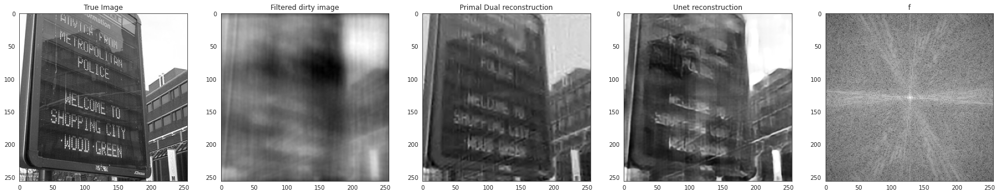

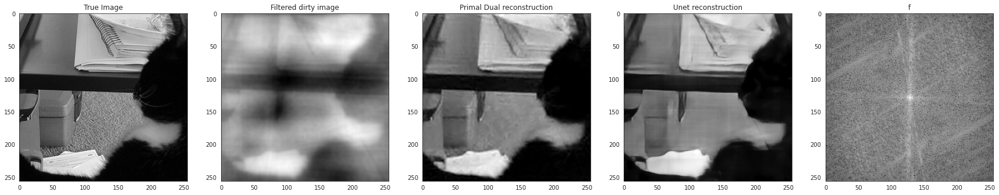

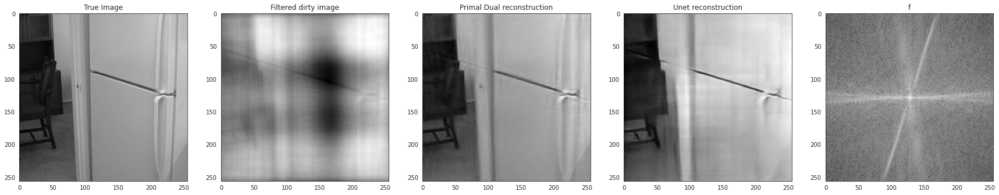

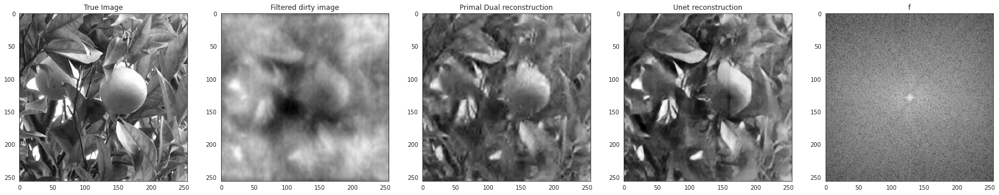

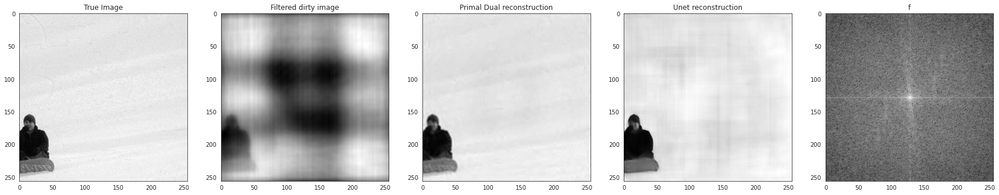

In [167]:
for i in range(5):
    compare([x_true_test[i,:,:,0], x_dirty_test[i,:,:,0], PD_test_predict[i,:,:,0], NN_test_predict_2[i,:,:,0], np.log(freq_compare(x_true_test[i,:,:,0], NN_test_predict_2[i,:,:,0]))], titles=["True Image", "Filtered dirty image", "Primal Dual reconstruction", "Unet reconstruction", "f"])

In [173]:
freq_res_NN = [freq_compare(x_true_test[i,:,:,0], NN_test_predict_2[i,:,:,0]) for i in range(len(x_true_test))]
freq_res_PD = [freq_compare(x_true_test[i,:,:,0], PD_test_predict[i,:,:,0]) for i in range(len(x_true_test))]

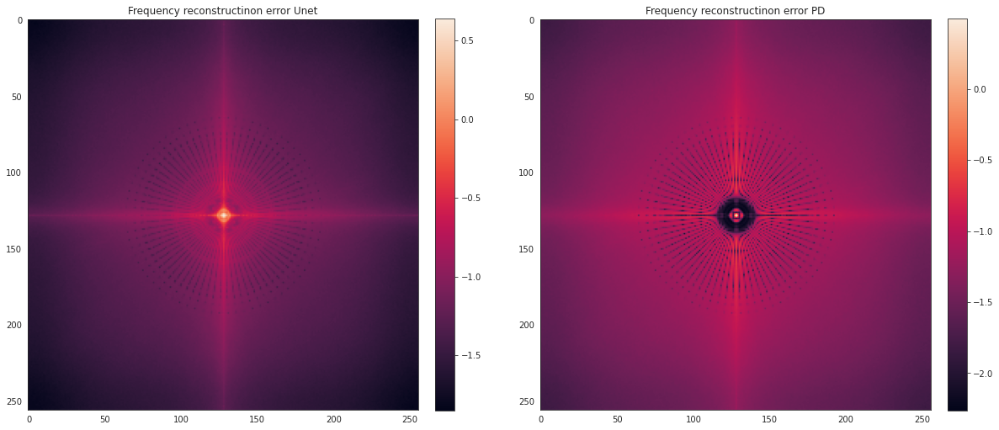

In [189]:
fig, ax = plt.subplots(ncols=2, figsize=(20,10))
im1 = ax[0].imshow(np.log10(np.mean(freq_res_NN, axis = 0)))
im2 = ax[1].imshow(np.log10(np.mean(freq_res_PD, axis = 0)))
ax[0].set_title("Frequency reconstructinon error Unet")
ax[1].set_title("Frequency reconstructinon error PD")

plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)
plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

In [115]:
results = [
    ("Dirty", "Train", x_true, x_dirty),
    ("Dirty", "Test", x_true_test, x_dirty_test),

    ("Primal Dual", "Train", x_true[np.sum(PD_train_predict, axis=(1,2)).nonzero()[0]], PD_train_predict[np.sum(PD_train_predict, axis=(1,2)).nonzero()[0]]),
    ("Primal Dual", "Test", x_true_test[np.sum(PD_test_predict, axis=(1,2)).nonzero()[0]], PD_test_predict[np.sum(PD_test_predict, axis=(1,2)).nonzero()[0]]),
#     ("small U-net", "Train", x_true, NN_train_predict_small),
#     ("small U-net", "Test", x_true_test, NN_test_predict_small),
    ("U-net", "Train", x_true, NN_train_predict_2),
    ("U-net", "Test", x_true_test, NN_test_predict_2),
]

metrics = [
    ("PSNR", peak_signal_noise_ratio),
    ("SSIM", structural_similarity),
    ("MSE", mean_squared_error)
]

In [116]:
%%time
statistics = pd.DataFrame(columns=["PSNR", "SSIM", "MSE", "method", "set"])#{}
statistics["PSNR"] = 0
    # statistics[metric] = pd.DataFrame()
for name, set, x, y in results:
    df = pd.DataFrame()
    for metric, f in metrics:
        df[metric] = [f(x[i,:,:,0],y[i,:,:,0]) for i in range(len(x))]
    df['Method'] = name
    df['Set'] = set
    if statistics.empty:
        statistics = df
    else:
        statistics = statistics.append(df, ignore_index=False)

CPU times: user 1min 16s, sys: 1.31 s, total: 1min 17s
Wall time: 1min 17s


In [117]:
with pd.option_context('mode.use_inf_as_na', True):
    statistics.dropna(inplace=True)

In [118]:
width = 10
print(f"|{'Name':20}|", end="")
for metric, f in metrics:
    print(f"{metric:20}|", end="")
print()
for name, set, x, y in results:
    print(f"|{name+'_'+set:20}|", end="")
    for metric, f in metrics:
        print(f"{np.mean(statistics[metric][(statistics.Method == name) * (statistics.Set == set)]):8.3f} \pm {np.std(statistics[metric][(statistics.Method == name) * (statistics.Set == set)]):7.3f}|", end="")
    print()

|Name                |PSNR                |SSIM                |MSE                 |
|Dirty_Train         |   7.465 \pm   2.330|   0.099 \pm   0.054|   0.203 \pm   0.096|
|Dirty_Test          |   7.612 \pm   2.482|   0.094 \pm   0.054|   0.199 \pm   0.100|
|Primal Dual_Train   |  23.951 \pm   3.783|   0.764 \pm   0.119|   0.006 \pm   0.005|
|Primal Dual_Test    |  23.816 \pm   3.748|   0.760 \pm   0.119|   0.006 \pm   0.005|
|U-net_Train         |  21.268 \pm   2.741|   0.716 \pm   0.120|   0.009 \pm   0.006|
|U-net_Test          |  21.229 \pm   2.707|   0.712 \pm   0.120|   0.009 \pm   0.006|


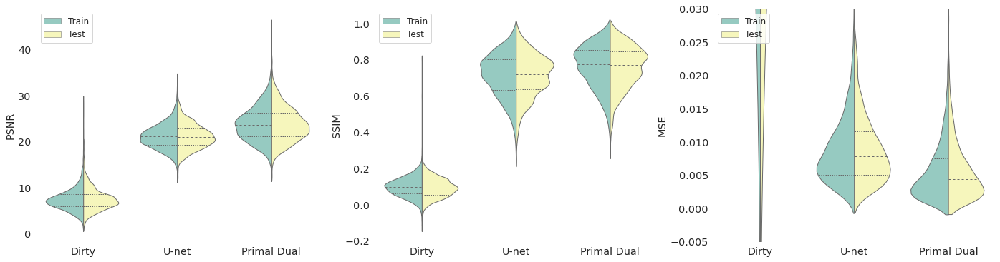

In [119]:
fig, ax = plt.subplots(ncols=len(metrics), figsize=(len(metrics)*8, 6))
for idx, (metric, _) in enumerate(metrics):
    plt.sca(ax[idx])
    sns.set_style('whitegrid')
    sns.violinplot(data=statistics, x='Method', y=metric, split=True, hue='Set', palette="Set3", bw=.2, cut=1, linewidth=1, inner='quart', order=["Dirty", "U-net", "Primal Dual"])
    plt.ylabel(metric, fontsize='x-large')
    plt.xlabel("")
    ax[idx].tick_params(labelsize='x-large')
    # ax[idx].xaxis.label.set_size('x-large')
    sns.despine(left=True, bottom=True)
    plt.legend(loc="upper left", fontsize='large')

ax[-1].set_ylim([-0.005, 0.03])
# ax[-1].set_yscale('log')
plt.show()

,PSNR,SSIM,MSE,Method,Set
0,6.760430,0.126438,0.210842,Dirty,Train
1,5.303345,0.074210,0.294894,Dirty,Train
2,15.591036,0.134727,0.027599,Dirty,Train
3,10.059770,0.011970,0.098633,Dirty,Train
4,5.826602,0.135757,0.261421,Dirty,Train
...,...,...,...,...,...
995,-11.277666,-0.001848,13.420435,small U-net,Test
996,-13.567531,0.001244,22.738043,small U-net,Test
997,-3.694015,-0.058777,2.341001,small U-net,Test
998,-4.902334,-0.028099,3.091957,small U-net,Test


PSNR        35.145735
SSIM         0.994665
MSE        135.421024
Method    small U-net
Set             Train
dtype: object

In [1]:
a

NameError: name 'a' is not defined

In [37]:
NN_train_predict_small.max()

1.3612881

# dataset

In [1]:
from src.dataset import *

Failed to import NUDFT_cupy (experimental). Use NUDFT() instead. 


In [18]:
import tqdm

In [2]:
from src.visualisation import compare

In [40]:
import matplotlib.pyplot as plt

In [44]:
from skimage import color, io

In [3]:


tf_func, func = measurement_func()


In [37]:
ds = Dataset(2000)


In [38]:
dataset = ds.map(crop).map(tf_func).batch(2000).map(data_map).cache()

In [9]:
j = 0

In [39]:
mse = []
for i, a in enumerate(dataset):
#     print(a)
    for j in range(2000):
        mse.append(mean_squared_error(a[0][0][j].numpy(), a[1][j].numpy()))
    

In [43]:
np.where(np.array(mse) > 1)

(array([ 190,  221, 1352, 1702, 1763, 1793]),)

In [45]:
files = np.loadtxt(os.environ["HOME"] + "/src_aiai/images.txt", dtype=str)


In [64]:
sample_idx = 221

In [69]:
im = io.imread(files[sample_idx], as_gray=True)
# im = color.rgb2gray(im)
if type(im[0,0]) == np.uint8:
    im = im/ 255.
im = im[:,:, np.newaxis]

In [71]:
im

array([[[0.52941176],
        [0.57647059],
        [0.55686275],
        ...,
        [0.35686275],
        [0.35686275],
        [0.31764706]],

       [[0.64313725],
        [0.62745098],
        [0.65490196],
        ...,
        [0.34509804],
        [0.34901961],
        [0.31372549]],

       [[0.71372549],
        [0.74117647],
        [0.77647059],
        ...,
        [0.34901961],
        [0.36078431],
        [0.32941176]],

       ...,

       [[0.61960784],
        [0.56470588],
        [0.55294118],
        ...,
        [0.80784314],
        [0.92156863],
        [0.94901961]],

       [[0.5254902 ],
        [0.5254902 ],
        [0.50980392],
        ...,
        [0.80784314],
        [0.92156863],
        [0.95294118]],

       [[0.50980392],
        [0.52156863],
        [0.50588235],
        ...,
        [0.78039216],
        [0.91372549],
        [0.94901961]]])

In [21]:
b = color.rgb2gray(a)[:,:,np.newaxis]

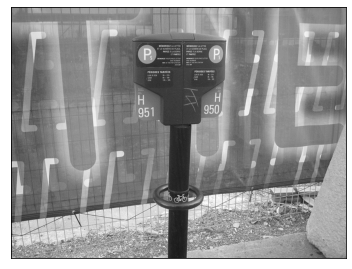

In [22]:
compare([b[:,:,0]])

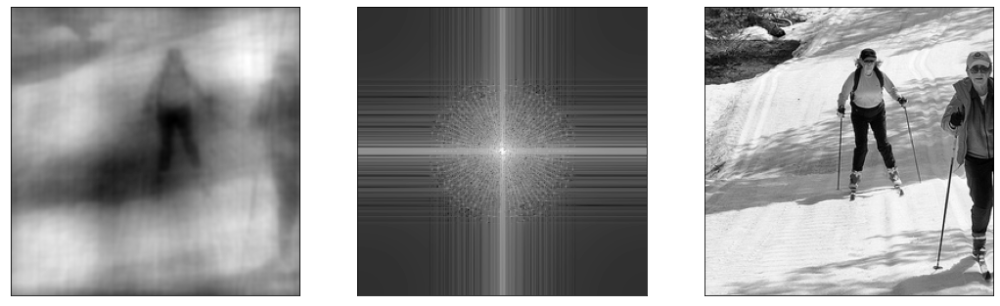

In [12]:
for i in dataset:
#     print(i)
#     a = i
#     compare([i])
#     compare([i[0][j], np.log(np.abs(i[1][j])), i[2][j]])
#     compare([i[0][0][j], np.log(np.abs(i[0][1][j])), i[1][j]])

In [13]:
i[0][0][j]

<tf.Tensor: shape=(256, 256, 1), dtype=float32, numpy=
array([[[-0.06982916],
        [-0.0349728 ],
        [-0.03510634],
        ...,
        [ 0.0320859 ],
        [ 0.02082017],
        [-0.02485255]],

       [[-0.07941625],
        [-0.04268026],
        [-0.04225861],
        ...,
        [ 0.05066339],
        [ 0.03445469],
        [-0.01625656]],

       [[-0.08604416],
        [-0.04798033],
        [-0.04744618],
        ...,
        [ 0.06574029],
        [ 0.04705975],
        [-0.00568917]],

       ...,

       [[ 0.049445  ],
        [ 0.11331057],
        [ 0.14009929],
        ...,
        [-0.01162485],
        [-0.02325313],
        [-0.06894793]],

       [[ 0.03434242],
        [ 0.0923183 ],
        [ 0.11529694],
        ...,
        [-0.03947661],
        [-0.04521848],
        [-0.08493561]],

       [[ 0.01501526],
        [ 0.06360341],
        [ 0.0807033 ],
        ...,
        [-0.06985889],
        [-0.06795782],
        [-0.09970137]]], dtype=float32)

In [34]:
np.mean(a), np.std(a)

(0.07407836, 0.14725457)

In [30]:
from skimage import io
import glob
import os
import tqdm

In [31]:
l = []
for i in tqdm.tqdm(glob.glob(os.environ["HOME"] + "/src_aiai/data/val2017/*.jpg")):
    a = io.imread(i)
    if a.shape[0] >= 260 and a.shape[1] >=260:
        l.append(i)

100%|██████████| 5000/5000 [03:17<00:00, 25.27it/s]


In [26]:
a.shape

(640, 425, 3)

In [35]:
np.savetxt('images.txt', l, fmt='%s')

In [38]:
np.loadtxt('images.txt', dtype=str)

array(['/home/ucapmm6/src_aiai/data/val2017/000000414170.jpg',
       '/home/ucapmm6/src_aiai/data/val2017/000000495054.jpg',
       '/home/ucapmm6/src_aiai/data/val2017/000000064495.jpg', ...,
       '/home/ucapmm6/src_aiai/data/val2017/000000128654.jpg',
       '/home/ucapmm6/src_aiai/data/val2017/000000438862.jpg',
       '/home/ucapmm6/src_aiai/data/val2017/000000194471.jpg'],
      dtype='<U52')